In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier

In [ ]:
cdc_df = pd.read_csv('2015.csv')

In [ ]:
cdc_df

,_STATE,FMONTH,IDATE,IMONTH,IDAY,IYEAR,DISPCODE,SEQNO,_PSU,CTELENUM,...,_PAREC1,_PASTAE1,_LMTACT1,_LMTWRK1,_LMTSCL1,_RFSEAT2,_RFSEAT3,_FLSHOT6,_PNEUMO2,_AIDTST3
0,1.0,1.0,b'01292015',b'01',b'29',b'2015',1200.0,2.015000e+09,2.015000e+09,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,1.0
1,1.0,1.0,b'01202015',b'01',b'20',b'2015',1100.0,2.015000e+09,2.015000e+09,1.0,...,2.0,2.0,3.0,3.0,4.0,2.0,2.0,NaN,NaN,2.0
2,1.0,1.0,b'02012015',b'02',b'01',b'2015',1200.0,2.015000e+09,2.015000e+09,1.0,...,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,NaN
3,1.0,1.0,b'01142015',b'01',b'14',b'2015',1100.0,2.015000e+09,2.015000e+09,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,9.0
4,1.0,1.0,b'01142015',b'01',b'14',b'2015',1100.0,2.015000e+09,2.015000e+09,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,72.0,11.0,b'12162015',b'12',b'16',b'2015',1100.0,2.015005e+09,2.015005e+09,NaN,...,4.0,2.0,2.0,2.0,3.0,1.0,1.0,2.0,2.0,2.0
441452,72.0,11.0,b'12142015',b'12',b'14',b'2015',1100.0,2.015005e+09,2.015005e+09,NaN,...,2.0,2.0,3.0,3.0,4.0,1.0,1.0,NaN,NaN,1.0
441453,72.0,11.0,b'12232015',b'12',b'23',b'2015',1200.0,2.015005e+09,2.015005e+09,NaN,...,9.0,9.0,3.0,3.0,4.0,9.0,9.0,9.0,9.0,NaN
441454,72.0,11.0,b'12152015',b'12',b'15',b'2015',1100.0,2.015005e+09,2.015005e+09,NaN,...,4.0,2.0,3.0,3.0,4.0,1.0,1.0,NaN,NaN,2.0


In [ ]:
# Columns related to Cardiovascular Diseases
cv_columns = ['CHECKUP1','BPHIGH4', 'BPMEDS', 'BLOODCHO', 'CHOLCHK', 'TOLDHI2', 'CVDINFR4','CVDCRHD4','CVDSTRK3', 
                'SEX','MARITAL', 'VETERAN3', 'EMPLOY1', 'CHILDREN','QLACTLM2','DIFFWALK','USENOW3', 
                'PDIABTST','CVDASPRN','SCNTMNY1', 'SCNTMEL1','SCNTWRK1','_RFHLTH', '_RFHYPE5', '_MICHD', 
                '_RACE', '_AGE_G','_BMI5CAT', '_EDUCAG', '_INCOMG', '_SMOKER3', 'DRNKANY5', '_RFBING5', 
                '_DRNKWEK','FTJUDA1_', 'FRUTDA1_', 'BEANDAY_', 'GRENDAY_', 'ORNGDAY_', 'VEGEDA1_','_TOTINDA',
                '_PAINDX1','_PASTRNG']

df_cv = pd.DataFrame(cdc_df, columns = cv_columns)

In [ ]:
df_cv

,CHECKUP1,BPHIGH4,BPMEDS,BLOODCHO,CHOLCHK,TOLDHI2,CVDINFR4,CVDCRHD4,CVDSTRK3,SEX,...,_DRNKWEK,FTJUDA1_,FRUTDA1_,BEANDAY_,GRENDAY_,ORNGDAY_,VEGEDA1_,_TOTINDA,_PAINDX1,_PASTRNG
0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,...,5.397605e-79,1.700000e+01,3.300000e+01,6.700000e+01,3.300000e+01,17.0,100.0,2.0,2.0,2.0
1,4.0,3.0,NaN,1.0,4.0,2.0,2.0,2.0,2.0,2.0,...,5.397605e-79,7.000000e+00,1.700000e+01,7.000000e+00,2.900000e+01,29.0,13.0,1.0,1.0,2.0
2,1.0,3.0,NaN,1.0,1.0,1.0,7.0,2.0,1.0,2.0,...,9.990000e+04,NaN,NaN,NaN,NaN,NaN,NaN,9.0,9.0,9.0
3,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,...,5.397605e-79,5.397605e-79,1.000000e+02,5.397605e-79,3.000000e+00,3.0,14.0,2.0,2.0,2.0
4,1.0,3.0,NaN,1.0,1.0,2.0,2.0,2.0,2.0,2.0,...,5.397605e-79,NaN,2.000000e+02,4.300000e+01,5.700000e+01,33.0,67.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,...,5.397605e-79,2.900000e+01,5.397605e-79,7.100000e+01,5.397605e-79,14.0,14.0,2.0,2.0,2.0
441452,1.0,3.0,NaN,1.0,1.0,2.0,2.0,2.0,2.0,2.0,...,5.397605e-79,1.700000e+01,1.000000e+02,2.900000e+01,1.000000e+01,14.0,29.0,1.0,1.0,2.0
441453,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,...,9.300000e+01,NaN,NaN,NaN,NaN,NaN,NaN,9.0,9.0,9.0
441454,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,...,5.397605e-79,1.000000e+02,1.000000e+02,1.000000e+02,2.900000e+01,3.0,3.0,2.0,2.0,2.0


In [ ]:
# Replace different NA codes with NAN

# CHECKUP1 code: [7, 9] is 'don't know/refused'
df_cv['CHECKUP1'].replace([7, 9], np.nan, inplace=True)

# BPHIGH4 code: [7, 9] is 'don't know/refused'
df_cv['BPHIGH4'].replace([7, 9], np.nan, inplace=True)

# BPMEDS code: [7, 9] is 'don't know/refused'
df_cv['BPMEDS'].replace([7, 9], np.nan, inplace=True)

# BLOODCHO code: [7, 9] is 'don't know/refused'
df_cv['BLOODCHO'].replace([7, 9], np.nan, inplace=True)

# CHOLCHK code: [7, 9] is 'don't know/refused'
df_cv['CHOLCHK'].replace([7, 9], np.nan, inplace=True)

# TOLDHI2 code: [7, 9] is 'don't know/refused'
df_cv['TOLDHI2'].replace([7, 9], np.nan, inplace=True)

# CVDINFR4 code: [7, 9] is 'don't know/refused'
df_cv['CVDINFR4'].replace([7, 9], np.nan, inplace=True)


# CVDCRHD4 code: [7, 9] is 'don't know/refused'
df_cv['CVDCRHD4'].replace([7, 9], np.nan, inplace=True)

# v code: [7, 9] is 'don't know/refused'
df_cv['CVDSTRK3'].replace([7, 9], np.nan, inplace=True)

# QLACTLM2 code: [7, 9] is 'don't know/refused'
df_cv['QLACTLM2'].replace([7, 9], np.nan, inplace=True)

# DIFFWALK code: [7, 9] is 'don't know/refused'
df_cv['DIFFWALK'].replace([7, 9], np.nan, inplace=True)

# DIFFWALK code: [7, 9] is 'don't know/refused'
df_cv['USENOW3'].replace([7, 9], np.nan, inplace=True)

# DIFFWALK code: [7, 9] is 'don't know/refused'
df_cv['PDIABTST'].replace([7, 9], np.nan, inplace=True)

# DIFFWALK code: [7, 9] is 'don't know/refused'
df_cv['CVDASPRN'].replace([7, 9], np.nan, inplace=True)

# DRNKANY5 code: [7, 9] is 'don't know/refused'
df_cv['DRNKANY5'].replace([7, 9], np.nan, inplace=True)

# DRNKANY5 code: [7, 9] is 'don't know/refused'
df_cv['DRNKANY5'].replace([7, 9], np.nan, inplace=True)



# VETERAN3 code: [7, 9] is 'don't know/refused'
df_cv['VETERAN3'].replace([7, 9], np.nan, inplace=True)

# PREGNANT code: [7, 9] is 'don't know/refused'
#df_cv['PREGNANT'].replace([7, 9], np.nan, inplace=True)


#9

# EMPLOY1 code: [9] is 'don't know/refused'
df_cv['EMPLOY1'].replace([9], np.nan, inplace=True)

# MARITAL code: 9 is 'refuse to answer'
df_cv['MARITAL'].replace(9, np.nan, inplace=True)

# _RFHLTH code: 9 is 'refuse to answer'
df_cv['_RFHLTH'].replace(9, np.nan, inplace=True)

# _RFHYPE5 code: 9 is 'refuse to answer'
df_cv['_RFHYPE5'].replace(9, np.nan, inplace=True)

# _RACEGR3 code: 9 is 'refuse to answer'
df_cv['_RACE'].replace(9, np.nan, inplace=True)

# _EDUCAG code: 9 is 'refuse to answer'
df_cv['_EDUCAG'].replace(9, np.nan, inplace=True)

# _INCOMG code: 9 is 'refuse to answer'
df_cv['_INCOMG'].replace(9, np.nan, inplace=True)

# _SMOKER3 code: 9 is 'refuse to answer'
df_cv['_SMOKER3'].replace(9, np.nan, inplace=True)

# _RFBING5 code: 9 is 'refuse to answer'
df_cv['_RFBING5'].replace(9, np.nan, inplace=True)

# _TOTINDA code: 9 is 'refuse to answer'
df_cv['_TOTINDA'].replace(9, np.nan, inplace=True)

# _PAINDX1 code: 9 is 'refuse to answer'
df_cv['_PAINDX1'].replace(9, np.nan, inplace=True)

# _PASTRNG code: 9 is 'refuse to answer'
df_cv['_PASTRNG'].replace(9, np.nan, inplace=True)


#88, 99

# CHILDREN code: [88,99] is 'don't know/refused'
df_cv['CHILDREN'].replace([88,99], np.nan, inplace=True)

# 7 8 9

# SCNTMNY1 code: [7,8,9] is 'don't know/refused'
df_cv['SCNTMNY1'].replace([7,8,9], np.nan, inplace=True)

# SCNTMEL1 code: [7,8,9] is 'don't know/refused'
df_cv['SCNTMEL1'].replace([7,8,9], np.nan, inplace=True)


# 97 98 99
# SCNTWRK1 code: [97,98,99] is 'don't know/refused'
df_cv['SCNTWRK1'].replace([97,98,99], np.nan, inplace=True)


#9999

# _DRNKWEK code: 99900 is 'refuse to answer'
df_cv['_DRNKWEK'].replace(99900, np.nan, inplace=True)

In [ ]:
df_cv.isnull().sum()

CHECKUP1      6115
BPHIGH4       1367
BPMEDS      263589
BLOODCHO      9481
CHOLCHK      65010
TOLDHI2      62715
CVDINFR4      2229
CVDCRHD4      3817
CVDSTRK3      1290
SEX              0
MARITAL       3096
VETERAN3       842
EMPLOY1       3795
CHILDREN    327637
QLACTLM2     12534
DIFFWALK     14594
USENOW3      16858
PDIABTST    362563
CVDASPRN    422686
SCNTMNY1    373260
SCNTMEL1    368414
SCNTWRK1    407666
_RFHLTH       1247
_RFHYPE5      1367
_MICHD        3942
_RACE         7437
_AGE_G           0
_BMI5CAT     36398
_EDUCAG       1811
_INCOMG      79505
_SMOKER3     17990
DRNKANY5     21650
_RFBING5     25611
_DRNKWEK     25733
FTJUDA1_     38535
FRUTDA1_     36582
BEANDAY_     39947
GRENDAY_     37949
ORNGDAY_     39258
VEGEDA1_     41463
_TOTINDA     37992
_PAINDX1     53260
_PASTRNG     44013
dtype: int64

In [ ]:
# Fill all null values with most frequent values of each column
df_cv = df_cv.fillna(df_cv.mode().iloc[0])

In [ ]:
df_cv.isnull().sum()

CHECKUP1    0
BPHIGH4     0
BPMEDS      0
BLOODCHO    0
CHOLCHK     0
TOLDHI2     0
CVDINFR4    0
CVDCRHD4    0
CVDSTRK3    0
SEX         0
MARITAL     0
VETERAN3    0
EMPLOY1     0
CHILDREN    0
QLACTLM2    0
DIFFWALK    0
USENOW3     0
PDIABTST    0
CVDASPRN    0
SCNTMNY1    0
SCNTMEL1    0
SCNTWRK1    0
_RFHLTH     0
_RFHYPE5    0
_MICHD      0
_RACE       0
_AGE_G      0
_BMI5CAT    0
_EDUCAG     0
_INCOMG     0
_SMOKER3    0
DRNKANY5    0
_RFBING5    0
_DRNKWEK    0
FTJUDA1_    0
FRUTDA1_    0
BEANDAY_    0
GRENDAY_    0
ORNGDAY_    0
VEGEDA1_    0
_TOTINDA    0
_PAINDX1    0
_PASTRNG    0
dtype: int64

In [ ]:
# heart attack or myocardial infarction confirmed cases
df_cv[df_cv['CVDINFR4'] == 1].shape

(25472, 43)

In [ ]:
# Angina or coronary heart disease confirmed cases
df_cv[df_cv['CVDCRHD4'] == 1].shape

(25290, 43)

In [ ]:
# Heart stroke confirmed cases
df_cv[df_cv['CVDSTRK3'] == 1].shape

(18269, 43)

In [ ]:
# Combine all above heart issues in target column:
df_cv["heart_issues"] = df_cv['CVDINFR4']
df_cv[df_cv['heart_issues'] == 1].shape
    

(25472, 44)

In [ ]:
df_cv.heart_issues = np.where(df_cv.CVDCRHD4.eq(1), df_cv.CVDCRHD4, df_cv.heart_issues)
df_cv[df_cv['heart_issues'] == 1].shape

(38633, 44)

In [ ]:
df_cv.heart_issues = np.where(df_cv.CVDSTRK3.eq(1), df_cv.CVDSTRK3, df_cv.heart_issues)
df_cv[df_cv['heart_issues'] == 1].shape

(50230, 44)

In [ ]:
# Dropping different heart issues columns as all cominded into one column
df_cv = df_cv.drop(['CVDINFR4', 'CVDCRHD4', 'CVDSTRK3'], axis = 1)

In [ ]:
df_cv

,CHECKUP1,BPHIGH4,BPMEDS,BLOODCHO,CHOLCHK,TOLDHI2,SEX,MARITAL,VETERAN3,EMPLOY1,...,FTJUDA1_,FRUTDA1_,BEANDAY_,GRENDAY_,ORNGDAY_,VEGEDA1_,_TOTINDA,_PAINDX1,_PASTRNG,heart_issues
0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,8.0,...,1.700000e+01,3.300000e+01,6.700000e+01,3.300000e+01,1.700000e+01,100.0,2.0,2.0,2.0,2.0
1,4.0,3.0,1.0,1.0,4.0,2.0,2.0,2.0,2.0,3.0,...,7.000000e+00,1.700000e+01,7.000000e+00,2.900000e+01,2.900000e+01,13.0,1.0,1.0,2.0,2.0
2,1.0,3.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,7.0,...,5.397605e-79,1.000000e+02,5.397605e-79,1.000000e+02,5.397605e-79,100.0,1.0,1.0,2.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,8.0,...,5.397605e-79,1.000000e+02,5.397605e-79,3.000000e+00,3.000000e+00,14.0,2.0,2.0,2.0,2.0
4,1.0,3.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,8.0,...,5.397605e-79,2.000000e+02,4.300000e+01,5.700000e+01,3.300000e+01,67.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,1.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,2.0,7.0,...,2.900000e+01,5.397605e-79,7.100000e+01,5.397605e-79,1.400000e+01,14.0,2.0,2.0,2.0,2.0
441452,1.0,3.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,...,1.700000e+01,1.000000e+02,2.900000e+01,1.000000e+01,1.400000e+01,29.0,1.0,1.0,2.0,2.0
441453,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,7.0,...,5.397605e-79,1.000000e+02,5.397605e-79,1.000000e+02,5.397605e-79,100.0,1.0,1.0,2.0,2.0
441454,1.0,1.0,1.0,1.0,1.0,2.0,1.0,5.0,2.0,3.0,...,1.000000e+02,1.000000e+02,1.000000e+02,2.900000e+01,3.000000e+00,3.0,2.0,2.0,2.0,2.0


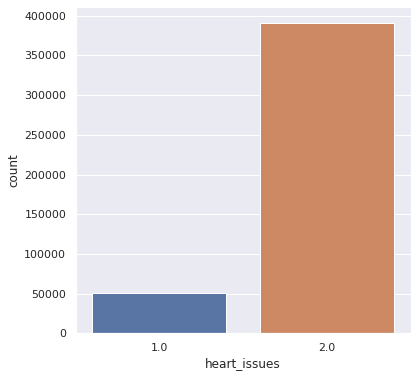

In [ ]:
# Plot different 'target' counts to check class balance
# Class 1 = Heart disease detected, Class 2 = No heart disease
# We can see class imbalance as only 12.5% class 1 data
sns.set(rc={'figure.figsize':(6,6)})
sns.countplot(df_cv['heart_issues'],label="Count")

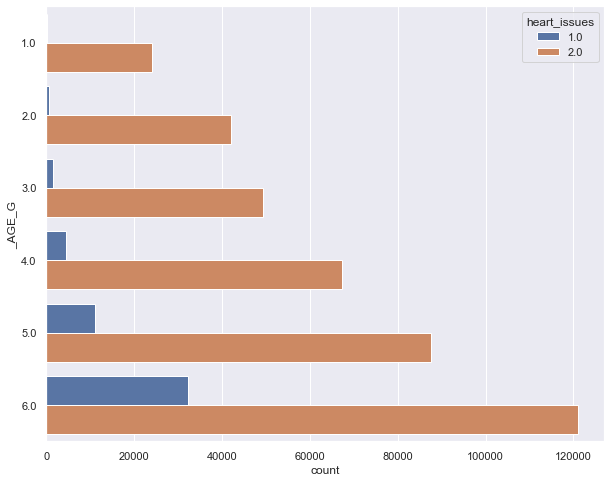

In [ ]:
# Compare heart disease cases with age
plt.figure(figsize=(10,8))
sns.countplot(y='_AGE_G', hue='heart_issues', data=df_cv)

Above _AGE_G is categorized as below:

1: Age 18 to 24

2: Age 25 to 34

3: Age 35 to 44

4: Age 45 to 54

5: Age 55 to 64

6: Age 65 or older

As per above graph maximum heart disease detected at 65 or older.

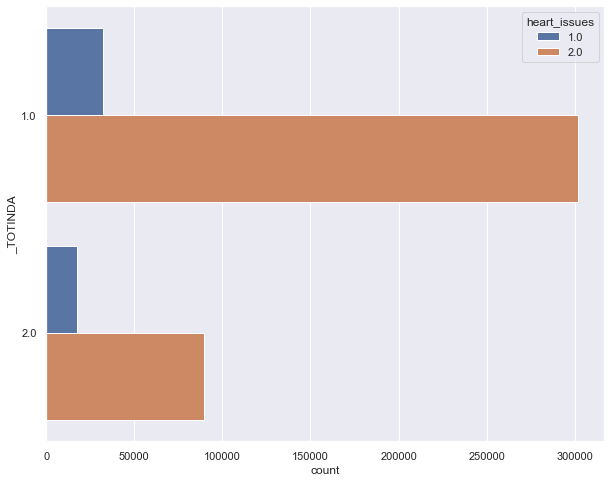

In [ ]:
# Compare heart disease cases with physical activity in last 30 days
plt.figure(figsize=(10,8))
sns.countplot(y='_TOTINDA', hue='heart_issues', data=df_cv)

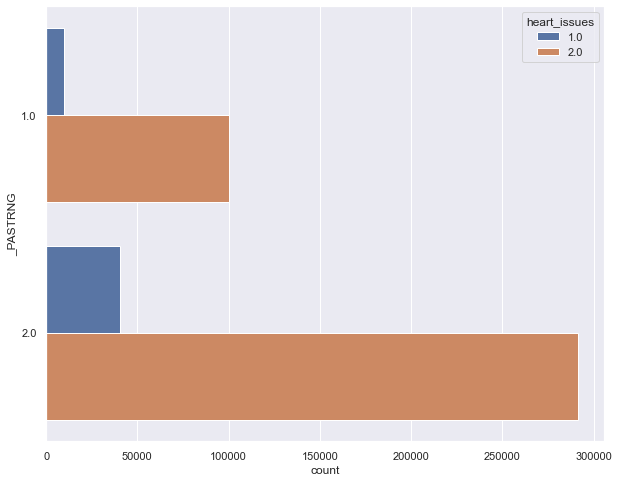

In [ ]:
# Compare heart disease cases with physical stregth
plt.figure(figsize=(10,8))
sns.countplot(y='_PASTRNG', hue='heart_issues', data=df_cv)

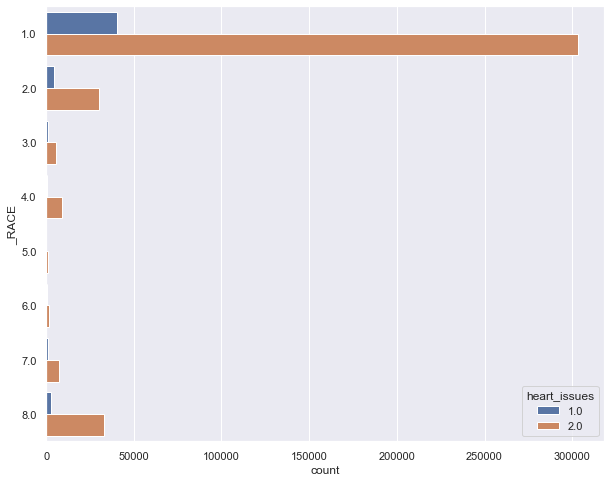

In [ ]:
# Compare heart disease cases with Race-Ethnicity
plt.figure(figsize=(10,8))
sns.countplot(y='_RACE', hue='heart_issues', data=df_cv)

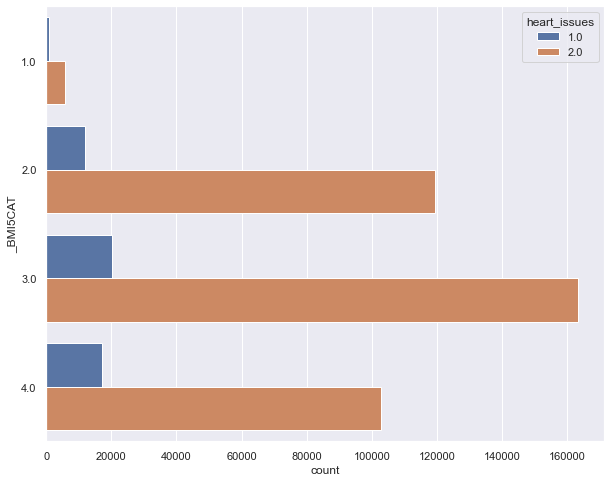

In [ ]:
# Compare heart disease cases with body mass index (BMI) categories
plt.figure(figsize=(10,8))
sns.countplot(y='_BMI5CAT', hue='heart_issues', data=df_cv)

Category 1: Underweight

Category 2: Normal weight

Category 3: Overweight

Category 4: Obese

### As per above graph highest percentage of heart diseases in Obese people 

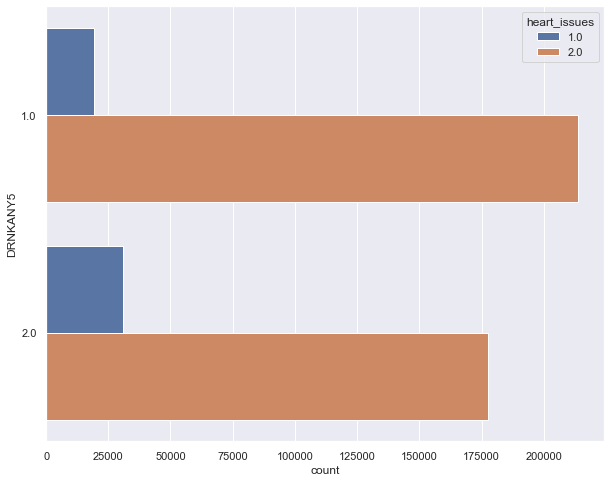

In [ ]:
# Compare heart disease cases for Adults who reported having had at least one drink of alcohol in the past 30 days.
# 1 : Yes, 2 : No
plt.figure(figsize=(10,8))
sns.countplot(y='DRNKANY5', hue='heart_issues', data=df_cv)

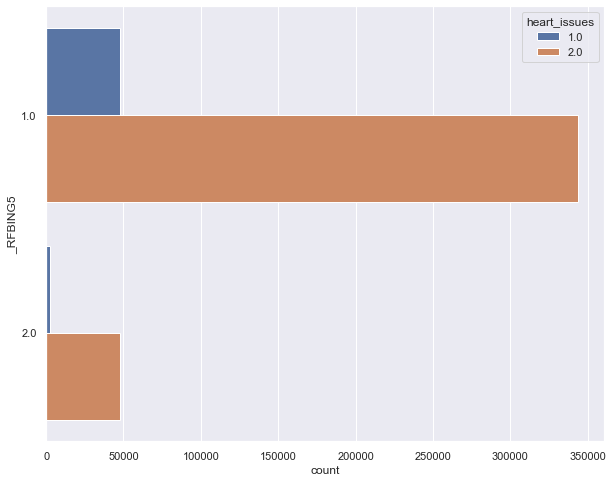

In [ ]:
# Compare heart disease cases for Binge drinkers (males having five or more drinks on one occasion, 
# females having four or more drinks on one occasion)
# 1 : No, 2 : Yes
plt.figure(figsize=(10,8))
sns.countplot(y='_RFBING5', hue='heart_issues', data=df_cv)

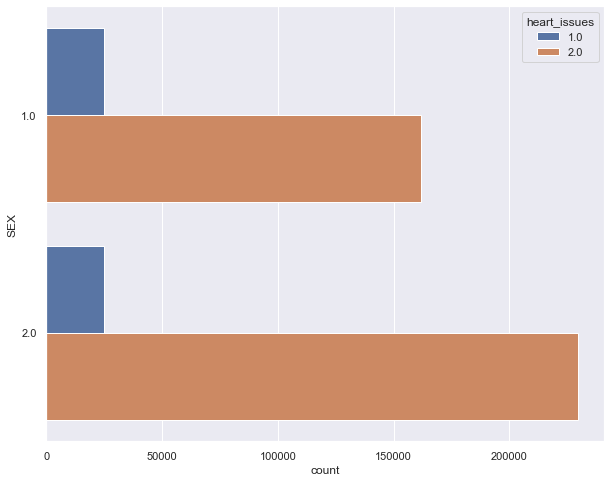

In [ ]:
# Compare heart disease cases for Male, Female
# 1 : Male, 2 : Female
plt.figure(figsize=(10,8))
sns.countplot(y='SEX', hue='heart_issues', data=df_cv)

### As per above count of heart disease are same for both Males and Females but percentage of heart diseases is more for Males

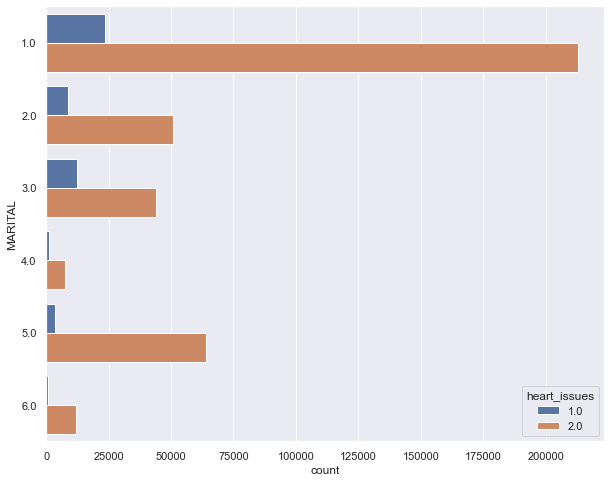

In [ ]:
# Compare heart disease cases for different Marital status categories
# 1 : Male, 2 : Female
plt.figure(figsize=(10,8))
sns.countplot(y='MARITAL', hue='heart_issues', data=df_cv)

### As per above highest heart diseases percentage is observed for Widowed people (Category 3). This looks related to age factor as most of widow people of old age. Which can be seen in below graph, where Maratial Category 3 has highest percenatge of 65 and above people.

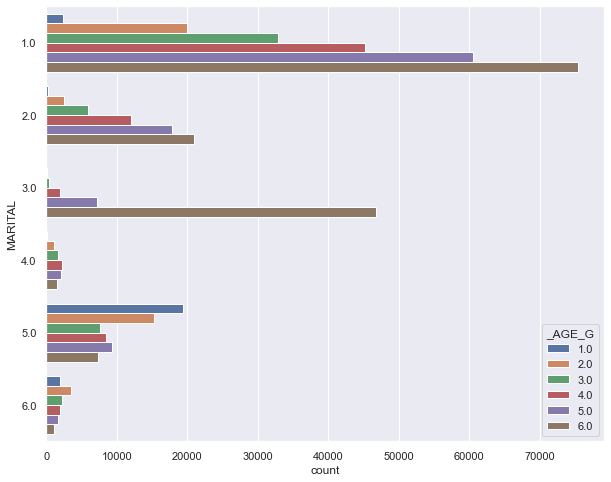

In [ ]:
# Compare heart disease cases for different Marital status categories
# 1 : Male, 2 : Female
plt.figure(figsize=(10,8))
sns.countplot(y='MARITAL', hue='_AGE_G', data=df_cv)

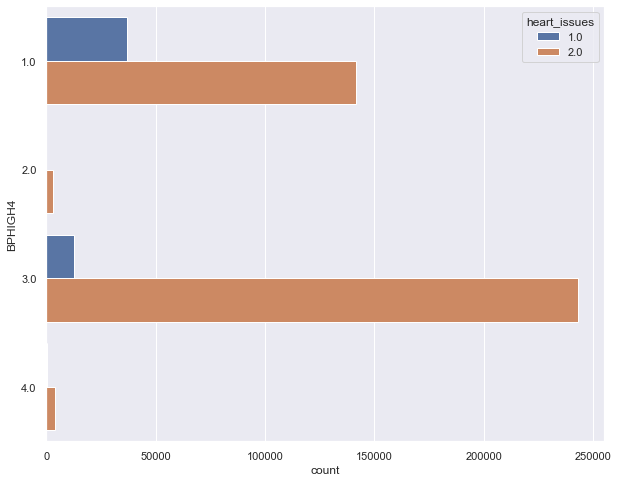

In [ ]:
# Compare heart disease cases for different high blood pressure categories
# 1 : Yes, 2 : Yes, during pregnancy, 3: No, 4: Told borderline high or pre-hypertensive
plt.figure(figsize=(10,8))
sns.countplot(y='BPHIGH4', hue='heart_issues', data=df_cv)

### As per above percentage of heart diseases more with high blood pressure people

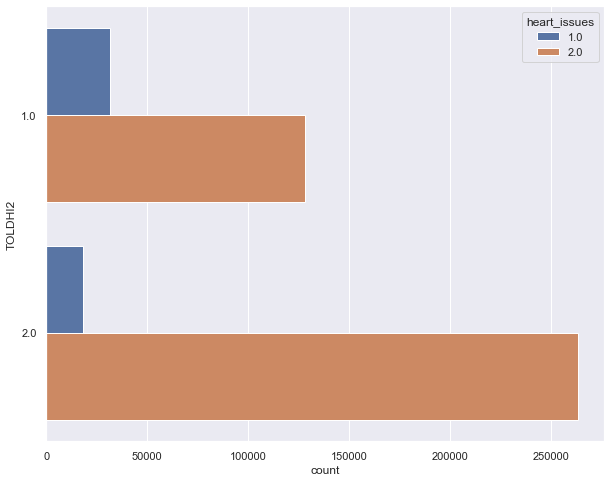

In [ ]:
# Compare heart disease cases for different high blood cholesterol categories
# 1 : Yes high cholesterol, 2 : Not high cholesterol
plt.figure(figsize=(10,8))
sns.countplot(y='TOLDHI2', hue='heart_issues', data=df_cv)

### As expected people with high blood cholesterol has high perecentage of heart diseases

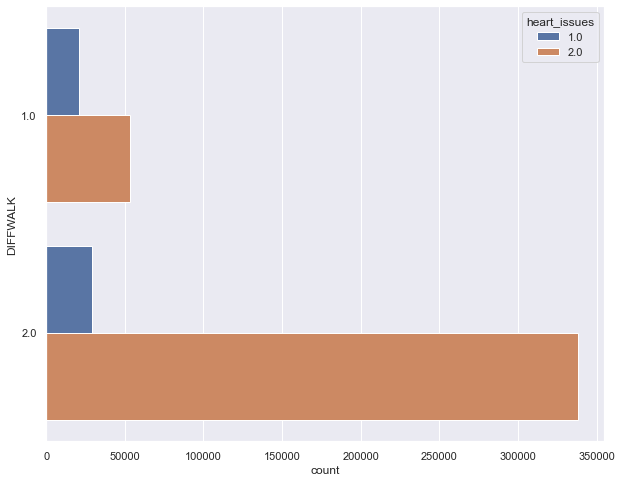

In [ ]:
# Compare heart disease cases for people with or without difficulty walking or climbing stairs
# 1 : Yes feel difficulty, 2 : No difficulty
plt.figure(figsize=(10,8))
sns.countplot(y='DIFFWALK', hue='heart_issues', data=df_cv)

### As per above graph people with walking and climbing difficulties has more percenatge of heart diseases

In [ ]:
def with_hue(plot, feature, Number_of_categories, hue_categories):
    a = [p.get_width() for p in plot.patches]
    patch = [p for p in plot.patches]
    for i in range(Number_of_categories):
        total = feature.value_counts().values[i]
        for j in range(hue_categories):
            percentage = '{:.1f}%'.format(100 * a[(j*Number_of_categories + i)]/total)
            x = patch[(j*Number_of_categories + i)].get_x() + patch[(j*Number_of_categories + i)].get_width() / 2 - 0.15
            y = patch[(j*Number_of_categories + i)].get_y() + patch[(j*Number_of_categories + i)].get_height() 
            ax.annotate(percentage, (x, y), size = 12)
    plt.show()

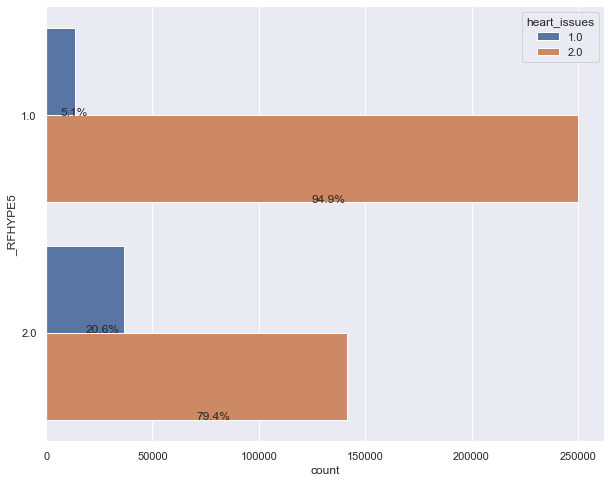

In [ ]:
# Compare heart disease cases for people with and withou high blood pressure
# 1 : Not high blood pressure, 2 : Yes high blood pressure 
plt.figure(figsize=(10,8))
ax = sns.countplot(y='_RFHYPE5', hue='heart_issues', data=df_cv)
with_hue(ax, df_cv._RFHYPE5, 2, 2)

### As per above high percentages of heart issues in people with high blood pressure

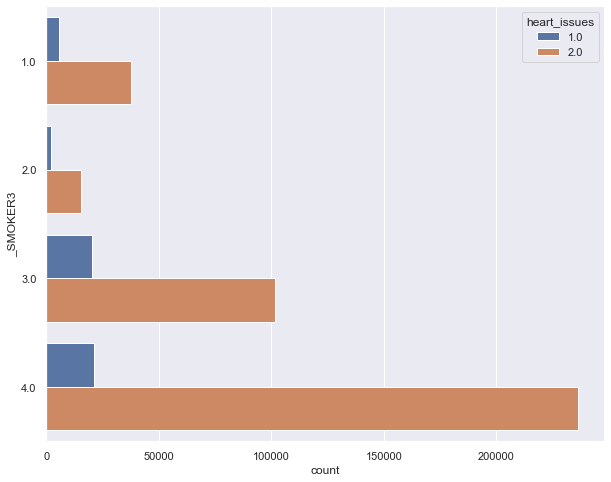

In [ ]:
# Compare heart disease cases with smoking habits
# 1 : current smoker, smoke daily, 2 : current smoker, smoke some days, 3: Former Smoker, 4: Never Smoked
plt.figure(figsize=(10,8))
sns.countplot(y='_SMOKER3', hue='heart_issues', data=df_cv)

### As per above high percentages of heart issues in current and former smokers

In [ ]:
#Separating features and target
X = df_cv.drop(['heart_issues'], axis = 1)
y = df_cv['heart_issues']

In [ ]:
X

,CHECKUP1,BPHIGH4,BPMEDS,BLOODCHO,CHOLCHK,TOLDHI2,SEX,MARITAL,VETERAN3,EMPLOY1,...,_DRNKWEK,FTJUDA1_,FRUTDA1_,BEANDAY_,GRENDAY_,ORNGDAY_,VEGEDA1_,_TOTINDA,_PAINDX1,_PASTRNG
0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,8.0,...,5.397605e-79,1.700000e+01,3.300000e+01,6.700000e+01,3.300000e+01,1.700000e+01,100.0,2.0,2.0,2.0
1,4.0,3.0,1.0,1.0,4.0,2.0,2.0,2.0,2.0,3.0,...,5.397605e-79,7.000000e+00,1.700000e+01,7.000000e+00,2.900000e+01,2.900000e+01,13.0,1.0,1.0,2.0
2,1.0,3.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,7.0,...,5.397605e-79,5.397605e-79,1.000000e+02,5.397605e-79,1.000000e+02,5.397605e-79,100.0,1.0,1.0,2.0
3,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,8.0,...,5.397605e-79,5.397605e-79,1.000000e+02,5.397605e-79,3.000000e+00,3.000000e+00,14.0,2.0,2.0,2.0
4,1.0,3.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,8.0,...,5.397605e-79,5.397605e-79,2.000000e+02,4.300000e+01,5.700000e+01,3.300000e+01,67.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,1.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,2.0,7.0,...,5.397605e-79,2.900000e+01,5.397605e-79,7.100000e+01,5.397605e-79,1.400000e+01,14.0,2.0,2.0,2.0
441452,1.0,3.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,...,5.397605e-79,1.700000e+01,1.000000e+02,2.900000e+01,1.000000e+01,1.400000e+01,29.0,1.0,1.0,2.0
441453,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,7.0,...,9.300000e+01,5.397605e-79,1.000000e+02,5.397605e-79,1.000000e+02,5.397605e-79,100.0,1.0,1.0,2.0
441454,1.0,1.0,1.0,1.0,1.0,2.0,1.0,5.0,2.0,3.0,...,5.397605e-79,1.000000e+02,1.000000e+02,1.000000e+02,2.900000e+01,3.000000e+00,3.0,2.0,2.0,2.0


In [ ]:
# Applying StandardScaler()
ss_scaler = preprocessing.StandardScaler()
X_ss = ss_scaler.fit_transform(X)
X_ss # converted to Numpy array

array([[-0.46297707, -1.20486154, -0.26434323, ...,  1.7631528 ,
         1.18739966,  0.57476947],
       [ 2.38265883,  0.8115014 , -0.26434323, ..., -0.56716582,
        -0.84217642,  0.57476947],
       [-0.46297707,  0.8115014 , -0.26434323, ..., -0.56716582,
        -0.84217642,  0.57476947],
       ...,
       [-0.46297707, -1.20486154, -0.26434323, ..., -0.56716582,
        -0.84217642,  0.57476947],
       [-0.46297707, -1.20486154, -0.26434323, ...,  1.7631528 ,
         1.18739966,  0.57476947],
       [-0.46297707, -1.20486154, -0.26434323, ..., -0.56716582,
         1.18739966,  0.57476947]])

In [ ]:
# Convert Numpy array in dataframe for comparison before and after StandardScaler
X_ss_df = pd.DataFrame(data=X_ss[0:,0:],    # values
             #index=wine_df_mm[1:,0],    # 1st column as index
             columns=X.columns)

In [ ]:
X_ss_df

,CHECKUP1,BPHIGH4,BPMEDS,BLOODCHO,CHOLCHK,TOLDHI2,SEX,MARITAL,VETERAN3,EMPLOY1,...,_DRNKWEK,FTJUDA1_,FRUTDA1_,BEANDAY_,GRENDAY_,ORNGDAY_,VEGEDA1_,_TOTINDA,_PAINDX1,_PASTRNG
0,-0.462977,-1.204862,-0.264343,-0.356072,-0.429748,-1.326506,0.857017,-0.757889,0.388306,1.450009,...,-0.318684,-0.234009,-0.629166,0.928818,-0.426334,-0.222687,0.235280,1.763153,1.187400,0.574769
1,2.382659,0.811501,-0.264343,-0.356072,3.751788,0.753860,0.857017,-0.130262,0.388306,-0.307150,...,-0.318684,-0.384159,-0.778437,-0.413480,-0.488617,0.045419,-0.911678,-0.567166,-0.842176,0.574769
2,-0.462977,0.811501,-0.264343,-0.356072,-0.429748,-1.326506,0.857017,-0.130262,0.388306,1.098577,...,-0.318684,-0.489264,-0.004094,-0.570081,0.616905,-0.602503,0.235280,-0.567166,-0.842176,0.574769
3,-0.462977,-1.204862,-0.264343,-0.356072,-0.429748,-1.326506,0.857017,-0.757889,0.388306,1.450009,...,-0.318684,-0.489264,-0.004094,-0.570081,-0.893456,-0.535476,-0.898495,1.763153,1.187400,0.574769
4,-0.462977,0.811501,-0.264343,-0.356072,-0.429748,0.753860,0.857017,-0.757889,0.388306,1.450009,...,-0.318684,-0.489264,0.928850,0.391899,-0.052636,0.134787,-0.199773,1.763153,1.187400,0.574769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,-0.462977,-1.204862,-0.264343,-0.356072,-0.429748,-1.326506,0.857017,0.497365,0.388306,1.098577,...,-0.318684,-0.053829,-0.937038,1.018304,-0.940168,-0.289713,-0.898495,1.763153,1.187400,0.574769
441452,-0.462977,0.811501,-0.264343,-0.356072,-0.429748,0.753860,0.857017,-0.757889,0.388306,-1.010014,...,-0.318684,-0.234009,-0.004094,0.078696,-0.784461,-0.289713,-0.700743,-0.567166,-0.842176,0.574769
441453,-0.462977,-1.204862,-0.264343,-0.356072,-0.429748,-1.326506,0.857017,-0.757889,0.388306,1.098577,...,-0.198369,-0.489264,-0.004094,-0.570081,0.616905,-0.602503,0.235280,-0.567166,-0.842176,0.574769
441454,-0.462977,-1.204862,-0.264343,-0.356072,-0.429748,0.753860,-1.166838,1.752618,0.388306,-0.307150,...,-0.318684,1.012237,-0.004094,1.667081,-0.488617,-0.535476,-1.043512,1.763153,1.187400,0.574769


In [ ]:
# Covariance matrix
cov_matrix = X_ss_df.cov()

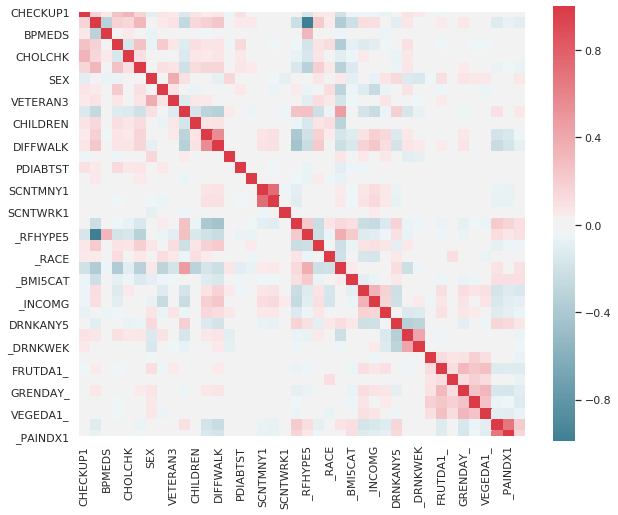

In [ ]:
# Heatmap of above Covariance matrix
f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cov_matrix, mask=np.zeros_like(cov_matrix, dtype=np.bool),
cmap=sns.diverging_palette(220, 10, as_cmap=True), square=True, ax=ax)#, annot=True

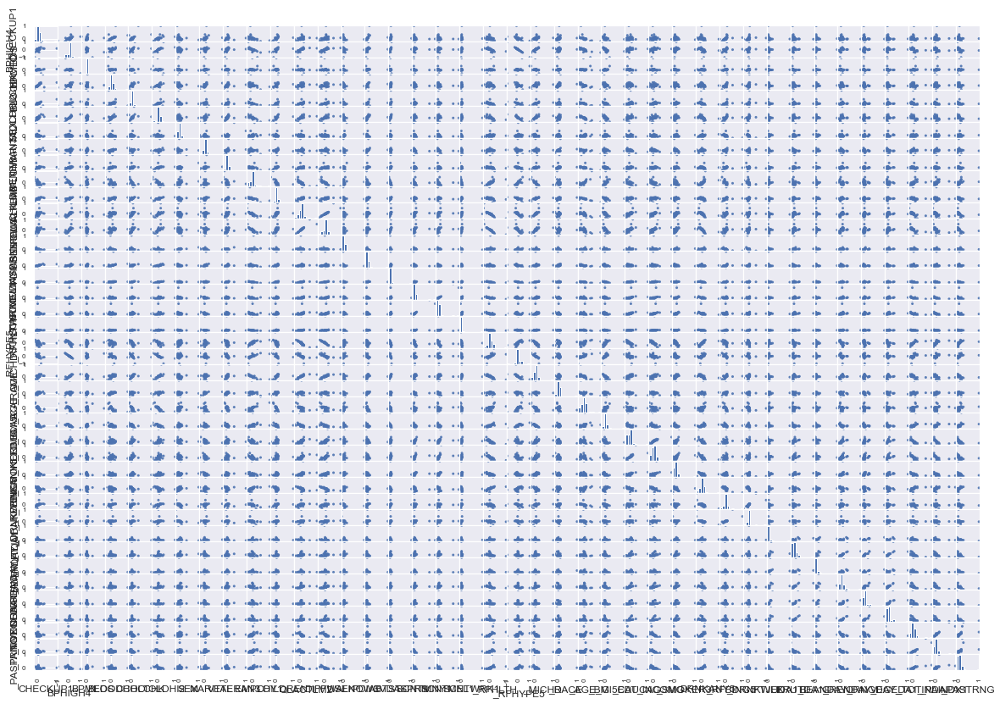

In [ ]:
# scatter_matrix to explore relationships between the attributes 
pd.plotting.scatter_matrix(cov_matrix, alpha = 0.9, figsize = (20,14), diagonal = 'hist')
#plt.tight_layout()
plt.show()

In [ ]:
#PCA
pca = PCA(.90) #choose the minimum number of principal components such that 90% of the variance is retained
df_pca = pca.fit_transform(X_ss_df) 
df_pca

array([[-4.88864818, -0.85644284,  0.95781889, ...,  0.37357861,
        -0.29739899,  0.54953373],
       [ 0.0503443 , -4.55520455,  1.79798243, ..., -1.52013931,
         1.41681466,  0.83001377],
       [-0.19950182,  1.14340865,  0.63162014, ...,  1.25012873,
        -1.3394135 , -0.01643571],
       ...,
       [-2.16566472,  0.77308464,  0.04040599, ..., -0.83593074,
        -0.47530794,  0.46620564],
       [-1.50371913, -1.66194963,  0.57666833, ...,  0.23305507,
         0.34460099,  0.96654774],
       [-2.78272722,  0.59260011,  0.66882181, ..., -1.82212656,
         1.16998365,  0.80040455]])

In [ ]:
# Number of features PCA choose after fitting the model for 90% variance
pca.n_components_

31

In [ ]:
# Convert Numpy array in dataframe for comparison before and after StandardScaler
df_pca_cv = pd.DataFrame(data=df_pca[0:,0:],    # values
             #index=wine_df_mm[1:,0],    # 1st column as index
             columns=["C1","C2","C3","C4","C5","C6","C7","C8","C9","C10","C11","C12","C13","C14",
                     "C15","C16","C17","C18","C19","C20","C21","C22","C23","C24","C25","C26","C27","C28","C29",
                      "C30","C31"])

In [ ]:
df_pca_cv

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,...,C22,C23,C24,C25,C26,C27,C28,C29,C30,C31
0,-4.888648,-0.856443,0.957819,-0.264829,0.829427,0.482999,1.292323,-0.617745,0.218398,-0.922343,...,-0.359254,0.223520,-0.126855,0.374620,-0.675425,-0.209700,0.141496,0.373579,-0.297399,0.549534
1,0.050344,-4.555205,1.797982,2.334225,-7.285705,0.834279,-1.226447,-0.395287,-4.717454,1.220367,...,0.624320,-0.203504,0.370596,0.007452,0.878084,1.249163,-0.640269,-1.520139,1.416815,0.830014
2,-0.199502,1.143409,0.631620,-1.153321,-0.132404,0.880536,-1.122545,-1.359345,0.100131,-0.134792,...,0.504191,-0.775040,-0.046728,0.962378,-0.591032,-0.650679,0.681728,1.250129,-1.339413,-0.016436
3,-4.327438,-1.216553,0.568530,-0.987710,-0.783206,0.295263,0.832747,-0.832355,-0.643919,0.075987,...,-0.082380,-0.722040,-0.344312,0.592677,0.146082,-0.493052,-0.711233,1.000619,-0.366227,-0.552301
4,-0.575072,-0.085688,1.730661,-1.646287,0.179709,1.102757,1.347331,-0.356927,0.502839,0.790103,...,0.097597,-0.101228,-0.359581,-0.520590,0.508721,-0.775229,-0.095576,0.896761,-0.276906,0.471667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,-4.417626,-1.676823,1.322294,-0.949319,1.890544,-0.736445,-0.346172,-0.116682,1.738139,1.578498,...,0.721666,-0.340068,0.056182,1.059466,-0.922415,-0.488667,-0.782766,1.242726,-0.772268,0.015481
441452,1.285837,-1.215550,1.288550,-1.414043,0.621886,-1.335062,-1.034199,0.368291,0.942088,-0.831938,...,0.589033,-0.757638,0.164189,-0.442924,0.630095,-0.466215,-0.123956,-1.478428,0.800005,1.281143
441453,-2.165665,0.773085,0.040406,-0.040814,0.817259,-1.478183,-0.869740,-0.656333,0.636580,-1.064695,...,-0.287656,-1.845035,0.145608,0.599512,-0.815708,0.628894,-0.453536,-0.835931,-0.475308,0.466206
441454,-1.503719,-1.661950,0.576668,-0.161453,1.891531,-2.032332,0.075417,1.576242,2.352784,2.332377,...,1.346373,0.980631,-0.976050,-0.264923,-0.344957,0.654834,-0.851509,0.233055,0.344601,0.966548


In [ ]:
# Train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df_pca_cv, y, train_size = 0.7)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((309019, 31), (132437, 31), (309019,), (132437,))

### Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
lgreg=LogisticRegression()
lgreg.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
y_pred=lgreg.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         1.0       1.00      0.77      0.87     15099
         2.0       0.97      1.00      0.99    117338

    accuracy                           0.97    132437
   macro avg       0.99      0.88      0.93    132437
weighted avg       0.97      0.97      0.97    132437



In [ ]:
# Check performance metrics on training data
y_pred_train=lgreg.predict(X_train)
print(classification_report(y_train, y_pred_train))

              precision    recall  f1-score   support

         1.0       1.00      0.77      0.87     35174
         2.0       0.97      1.00      0.99    273845

    accuracy                           0.97    309019
   macro avg       0.99      0.88      0.93    309019
weighted avg       0.97      0.97      0.97    309019



In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import r2_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
print("roc_auc_score: ", roc_auc_score(y_test, y_pred))
print("f1 score: ", f1_score(y_test, y_pred))
print("R2 score:", r2_score(y_test, y_pred))
print("Recall score:", recall_score(y_test, y_pred))
print("Precision score score:", precision_score(y_test, y_pred))

roc_auc_score:  0.887249991163864
f1 score:  0.8728946777453404
R2 score: 0.745510654465158
Recall score: 0.7745085015940489
Precision score score: 0.9999142514148517


##### KFold

In [ ]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
#10-fold cross validation
kfold10 = KFold(n_splits = 10, shuffle = True, random_state = 44)
cv10 = cross_val_score(lgreg, df_pca_cv, y, scoring = 'f1_macro', cv = kfold10)
print(f"5-fold cross val R2 score:{cv10}")
print(f"5-fold cross val R2 score mean:{cv10.mean()}")

5-fold cross val R2 score:[0.93013744 0.93033028 0.92969095 0.92628005 0.92964574 0.92716827
 0.92856441 0.92355645 0.92618012 0.92270604]
5-fold cross val R2 score mean:0.9274259751278648


In [ ]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
#10-fold cross validation
kfold10 = KFold(n_splits = 10, shuffle = True, random_state = 44)
cv10 = cross_val_score(lgreg, df_pca_cv, y, scoring = 'r2', cv = kfold10)
print(f"5-fold cross val R2 score:{cv10}")
print(f"5-fold cross val R2 score mean:{cv10.mean()}")

5-fold cross val R2 score:[0.74814833 0.74869824 0.74675201 0.7356744  0.74663738 0.73852923
 0.74320764 0.72704378 0.73541377 0.72427912]
5-fold cross val R2 score mean:0.7394383892743148


In [ ]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
#10-fold cross validation
kfold10 = KFold(n_splits = 10, shuffle = True, random_state = 44)
cv10 = cross_val_score(lgreg, df_pca_cv, y, scoring = 'recall', cv = kfold10)
print(f"5-fold cross val R2 score:{cv10}")
print(f"5-fold cross val R2 score mean:{cv10.mean()}")

5-fold cross val R2 score:[0.7769185  0.77773391 0.77546944 0.76599526 0.7752358  0.76851669
 0.77192627 0.75807094 0.76552548 0.75586948]
5-fold cross val R2 score mean:0.7691261774056176


### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Without any Pruning
#clf1 = DecisionTreeClassifier(max_depth=4, min_samples_split=4)
clf1 = DecisionTreeClassifier()
#training the model
clf1.fit(X_train, y_train)
# predict the test dataset values using model
y_pred1 = clf1.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred1)) # precison is down for class 1 comapred to Logistic Regresson

              precision    recall  f1-score   support

         1.0       0.74      0.79      0.76     15056
         2.0       0.97      0.96      0.97    117381

    accuracy                           0.94    132437
   macro avg       0.86      0.88      0.87    132437
weighted avg       0.95      0.94      0.95    132437



In [ ]:
print("roc_auc_score: ", roc_auc_score(y_test, y_pred1))
print("f1 score: ", f1_score(y_test, y_pred1))
print("R2 score:", r2_score(y_test, y_pred1))
print("Recall score:", recall_score(y_test, y_pred1))
print("Precision score score:", precision_score(y_test, y_pred1))

roc_auc_score:  0.8761470974818906
f1 score:  0.76331456154465
R2 score: 0.4488312319173253
Recall score: 0.7877258235919234
Precision score score: 0.7403708096635245


In [ ]:
from sklearn.tree import export_graphviz
#from sklearn.externals.six import StringIO 
from six import StringIO
from IPython.display import Image 

feature_cols = df_pca_cv.columns
dot_data = StringIO()
export_graphviz(clf1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['1','2'])
from pydot import graph_from_dot_data
(graph, ) = graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [ ]:
# With Pruning
clf2 = DecisionTreeClassifier(criterion='entropy',max_leaf_nodes=4)
#training the model
clf2.fit(X_train, y_train)
# predict the test dataset values using model
y_pred2 = clf2.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred2))

              precision    recall  f1-score   support

         1.0       0.96      0.60      0.74     15056
         2.0       0.95      1.00      0.97    117381

    accuracy                           0.95    132437
   macro avg       0.96      0.80      0.86    132437
weighted avg       0.95      0.95      0.95    132437



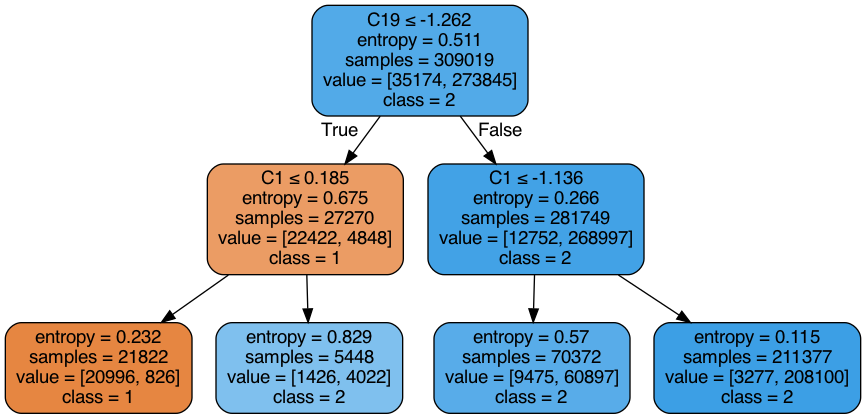

In [ ]:
feature_cols = df_pca_cv.columns
dot_data = StringIO()
export_graphviz(clf2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['1','2'])
from pydot import graph_from_dot_data
(graph, ) = graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [ ]:
# With Pruning
clf3 = DecisionTreeClassifier(criterion='entropy',max_depth=10)
#training the model
clf3.fit(X_train, y_train)
# predict the test dataset values using model
y_pred3 = clf3.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred3))

              precision    recall  f1-score   support

         1.0       0.99      0.77      0.86     15056
         2.0       0.97      1.00      0.98    117381

    accuracy                           0.97    132437
   macro avg       0.98      0.88      0.92    132437
weighted avg       0.97      0.97      0.97    132437



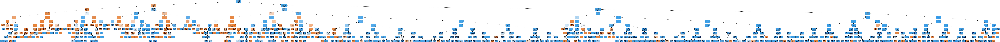

In [ ]:
feature_cols = df_pca_cv.columns
dot_data = StringIO()
export_graphviz(clf3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['1','2'])
from pydot import graph_from_dot_data
(graph, ) = graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [ ]:
# Without any Pruning
clf4 = DecisionTreeClassifier(criterion='entropy')
#training the model
clf4.fit(X_train, y_train)
# predict the test dataset values using model
y_pred4 = clf4.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred4)) 

              precision    recall  f1-score   support

         1.0       0.76      0.79      0.77     15056
         2.0       0.97      0.97      0.97    117381

    accuracy                           0.95    132437
   macro avg       0.87      0.88      0.87    132437
weighted avg       0.95      0.95      0.95    132437



#####  RandomizedSearchCV to find the best parameter settings for a decision tree classifier

In [ ]:
# Define model
clf_d = DecisionTreeClassifier(random_state=0)

In [ ]:
clf_d.get_params()

{'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': False,
 'random_state': 0,
 'splitter': 'best'}

In [ ]:
from sklearn.metrics import confusion_matrix
#from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
import time
import warnings
warnings.filterwarnings('ignore')
#warnings.filterwarnings(action='once')
# Set the parameters by cross-validation

tuned_parameters = [{'splitter': ['best'], 'max_depth': [5,10,15],
                     'criterion': ['gini', 'entropy']},
                    {'splitter': ['random'], 'max_depth': [5,10,15],
                     'criterion': ['gini', 'entropy']}]

scores = ['recall', 'precision'] # As need to have better recall metric

start_time_RCV = time.time() # to calculate time taken for hyper parameter search

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf_r = GridSearchCV(
        DecisionTreeClassifier(random_state=0), tuned_parameters, scoring='%s_macro' % score
    )
    clf_r.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf_r.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf_r.cv_results_['mean_test_score']
    stds = clf_r.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf_r.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf_r.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# to calculate time taken for hyper parameter search
elapsed_time_RCV = time.time() - start_time_RCV


# Tuning hyper-parameters for recall

Best parameters set found on development set:

{'criterion': 'entropy', 'max_depth': 15, 'splitter': 'best'}

Grid scores on development set:

0.866 (+/-0.007) for {'criterion': 'gini', 'max_depth': 5, 'splitter': 'best'}
0.878 (+/-0.005) for {'criterion': 'gini', 'max_depth': 10, 'splitter': 'best'}
0.879 (+/-0.004) for {'criterion': 'gini', 'max_depth': 15, 'splitter': 'best'}
0.870 (+/-0.005) for {'criterion': 'entropy', 'max_depth': 5, 'splitter': 'best'}
0.879 (+/-0.004) for {'criterion': 'entropy', 'max_depth': 10, 'splitter': 'best'}
0.879 (+/-0.004) for {'criterion': 'entropy', 'max_depth': 15, 'splitter': 'best'}
0.788 (+/-0.076) for {'criterion': 'gini', 'max_depth': 5, 'splitter': 'random'}
0.862 (+/-0.013) for {'criterion': 'gini', 'max_depth': 10, 'splitter': 'random'}
0.877 (+/-0.003) for {'criterion': 'gini', 'max_depth': 15, 'splitter': 'random'}
0.764 (+/-0.083) for {'criterion': 'entropy', 'max_depth': 5, 'splitter': 'random'}
0.8

In [ ]:
from sklearn.ensemble import RandomForestClassifier
#from xgboost import XGBClassifier
#! pip install xgboost
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import time
import warnings
warnings.filterwarnings('ignore')
#warnings.filterwarnings(action='once')

In [ ]:
from xgboost import XGBClassifier
#! pip install xgboost

In [ ]:
# Set the parameters by cross-validation
tuned_parameters = [{'learning_rate': [.1], 'max_depth': [3,5],
                     'n_estimators': [10, 50, 100, 200, 500]},
                    {'learning_rate': [.2], 'max_depth': [3,5],
                     'n_estimators': [10, 50, 100, 200, 500]},
                   {'learning_rate': [1], 'max_depth': [3,5],
                     'n_estimators': [10, 50, 100, 200, 500]}]

scores = ['f1']

start_time_XGB_RCV = time.time() # to calculate time taken for hyper parameter search

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf_xgb_rcv = GridSearchCV(
        XGBClassifier(random_state=0), tuned_parameters, scoring='%s_macro' % score
    )
    clf_xgb_rcv.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf_xgb_rcv.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf_xgb_rcv.cv_results_['mean_test_score']
    stds = clf_xgb_rcv.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf_xgb_rcv.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf_xgb_rcv.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# to calculate time taken for hyper parameter search
elapsed_time_XGB_RCV = time.time() - start_time_XGB_RCV


# Tuning hyper-parameters for f1

Best parameters set found on development set:

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}

Grid scores on development set:

0.897 (+/-0.004) for {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 10}
0.922 (+/-0.004) for {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
0.926 (+/-0.003) for {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
0.927 (+/-0.002) for {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
0.928 (+/-0.002) for {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
0.917 (+/-0.004) for {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 10}
0.925 (+/-0.003) for {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}
0.927 (+/-0.003) for {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
0.927 (+/-0.002) for {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
0.927 (+/-0.002) for {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
0.909 (+/-0.003) fo

In [ ]:
# Set the parameters by cross-validation
tuned_parameters = [{'bootstrap': ['true'], 'max_depth': [3,5],
                     'n_estimators': [10, 50, 100, 200, 500], 'max_features': [10,20,31]},
                    {'bootstrap': ['false'], 'max_depth': [3,5],
                     'n_estimators': [10, 50, 100, 200, 500], 'max_features': [10,20,31]}]

scores = ['f1']

start_time_RF_RCV = time.time() # to calculate time taken for hyper parameter search

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf_rf_rcv = GridSearchCV(
        RandomForestClassifier(random_state=0), tuned_parameters, scoring='%s_macro' % score
    )
    clf_rf_rcv.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf_rf_rcv.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf_rf_rcv.cv_results_['mean_test_score']
    stds = clf_rf_rcv.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf_rf_rcv.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf_rf_rcv.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# to calculate time taken for hyper parameter search
elapsed_time_RF_RCV = time.time() - start_time_RF_RCV


# Tuning hyper-parameters for f1

Best parameters set found on development set:

{'bootstrap': 'true', 'max_depth': 5, 'max_features': 10, 'n_estimators': 500}

Grid scores on development set:

0.892 (+/-0.007) for {'bootstrap': 'true', 'max_depth': 3, 'max_features': 10, 'n_estimators': 10}
0.898 (+/-0.007) for {'bootstrap': 'true', 'max_depth': 3, 'max_features': 10, 'n_estimators': 50}
0.899 (+/-0.006) for {'bootstrap': 'true', 'max_depth': 3, 'max_features': 10, 'n_estimators': 100}
0.900 (+/-0.007) for {'bootstrap': 'true', 'max_depth': 3, 'max_features': 10, 'n_estimators': 200}
0.900 (+/-0.006) for {'bootstrap': 'true', 'max_depth': 3, 'max_features': 10, 'n_estimators': 500}
0.908 (+/-0.005) for {'bootstrap': 'true', 'max_depth': 3, 'max_features': 20, 'n_estimators': 10}
0.905 (+/-0.006) for {'bootstrap': 'true', 'max_depth': 3, 'max_features': 20, 'n_estimators': 50}
0.903 (+/-0.006) for {'bootstrap': 'true', 'max_depth': 3, 'max_features': 20, 'n_estimators': 100}
0.903 (+/-

In [ ]:
elapsed_time_RF_RCV

41984.13967132568